In [2]:
# default_exp protein_intensities

# Protein Intensity Estimation

Derive protein intensity profiles from quantitative peptide data by 1) normalizing out sample-specific biases 2) normalizing out peptide-specific ionization factors and 3) taking a median estimate.

In [3]:
#export
import sys
sys.path.append('/Users/constantin/workspace/EmpiRe/MS-EmpiRe_Python/')
from ms_empire.background_distributions import *
from ms_empire.normalization import *
from ms_empire.diff_analysis import *
from ms_empire.visualizations import *
from ms_empire.benchmarking import *
from ms_empire.diffquant_utils import *
from ms_empire.diff_analysis_manager import *

In [4]:
import os
os.chdir("/Users/constantin/workspace/EmpiRe/MS-EmpiRe_Python")

## Wrapper function for normalizing proteins from external input file

In [5]:
#export
import pandas as pd
import numpy as np
def run_protein_normalization(input_file, protein_header, ion_header):
    input_df = pd.read_csv(input_file, sep = "\t")
    input_df = input_df.set_index([protein_header, ion_header])
    input_df = input_df.replace(0, np.nan)
    input_df = np.log2(input_df)
    betweencond_normed = pd.DataFrame(normalize_withincond(input_df.to_numpy().T).T, index = input_df.index, columns= input_df.columns)
    protnormed_df, ionnormed_df = estimate_protein_intensities(betweencond_normed)
    protnormed_df.to_csv(f"{input_file}.proteins.out", sep = "\t")
    ionnormed_df.to_csv(f"{input_file}.ions.out", sep = "\t")


## Estimate protein intensity profiles
After normalizing out the sample-specific biases, the protein intensities are estimated. For each protein, the peptide intensity profiles (i.e. the intensity of the peptide in each sample), are extracted. These profiles are then shifted on top of each other by multiplying each peptide profile with a constant scaling factor. This normalizes out the peptide-specific biases, for example due to differing ionization efficiencies. After shifting, the median intensity is chosen as the represenatative protein intensity for each sample. The relative protein profile is the rescaled to the overall summed peptide intensity.

In [7]:
#export
def estimate_protein_intensities(normed_df):
    prot_ints = []
    ion_ints = []

    count_prots = 0
    idx = normed_df.index.get_level_values(0)
    idx_ions = normed_df.index.get_level_values(1)
    allprots = idx.unique()
    for protein in allprots:
        if(count_prots%100 ==0):
            print(f"prot {count_prots} of {len(allprots)}")
        count_prots+=1

        protvals_df = pd.DataFrame(normed_df.loc[protein])

        protvals = protvals_df.to_numpy().copy()
        summed_pepints = np.nansum(2**protvals)
        if(protvals.shape[1]<2):
            normed_protvals = protvals
        else:
            normed_protvals = normalize_withincond(protvals)#norm_peptides(protvals)
        
        sample2reps = normed_protvals.T

        intens_vec = []
        for sample_idx in range(len(sample2reps)):
            reps = np.array(sample2reps[sample_idx])
            nonan_elems = sum(~np.isnan(reps))
            if(nonan_elems>=1):
                intens_vec.append(np.nanmedian(reps))
            else:
                intens_vec.append(np.nan)
        
        intens_vec = np.array(intens_vec)
        intens_conversion_factor = summed_pepints/np.nansum(2**intens_vec)
        scaled_vec = intens_vec+np.log2(intens_conversion_factor)
        prot_ints.append(scaled_vec)
        ion_ints.extend(normed_protvals)

    protein_df = 2**pd.DataFrame(prot_ints, index = allprots, columns = normed_df.columns)
    protein_df = protein_df.replace(np.nan, 0)
    ion_df = 2**pd.DataFrame(ion_ints, index = normed_df.index, columns = normed_df.columns)
    ion_df = ion_df.replace(np.nan, 0)
    return protein_df, ion_df

Visualize the peptide profiles for a given protein

In [ ]:
#export
import matplotlib.pyplot as plt
import numpy as np
def plot_lines(protvals, log = True):
    colors = plt.cm.tab20c(np.linspace(0,1,protvals.shape[0]))
    #cmap = plt.get_cmap("tab20c")
    idx = 0
    for row in protvals:
        if not log:
            row = 2**row
        plt.plot(row, c= colors[idx])
        idx+=1
    median_row = np.nanmedian(protvals, axis=0)
    print(median_row)
    plt.plot(median_row, c = 'black',linewidth =3 )
    plt.show()

def plot_points(protvals, log = True):
    colors = plt.cm.tab20c(np.linspace(0,1,protvals.shape[0]))
    #cmap = plt.get_cmap("tab20c")
    idx = 0
    for row in protvals:
        if not log:
            row = 2**row
        x_coord = list(range(len(row)))
        plt.scatter(x_coord,row, c= colors[idx])
        idx+=1

    plt.show()

Example data for single protein

In [ ]:
#hide
import os 
import matplotlib.pyplot as plt
import numpy as np


peptides_tsv = "./test_data/normed_apquant_peps.tsv"
samplemap_tsv = "./test_data/ap.samples.map"
unnormed_df, labelmap_df = read_tables(peptides_tsv, samplemap_tsv, "precursor")

unnormed_df = unnormed_df.set_index("protein")
protvals_df = unnormed_df.loc["sp|P0A8T8|RPOC_ECO57"]
display(protvals_df)
protvals = protvals_df.to_numpy()
normed_protvals = normalize_withincond(protvals_df.copy().to_numpy())

plot_lines(protvals)
plot_lines(normed_protvals)

Alternative function for estimating the peptide normalization factors

In [6]:
pep2reps = protvals
def norm_peptides_centroid_like(pep2reps):
    res = []
    l = list(pep2reps)
    l = list(filter(lambda pep : sum(~np.isnan(pep))>1, l))
    l.sort(key=lambda pep: np.nansum(pep), reverse= True)
    l.sort(key=lambda pep: sum(np.isnan(pep)))
    ref_pep = l[0]
    res.append(ref_pep)
    for idx in range(1, len(l)):
        to_shift_pep = l[idx]
        shifted = ref_pep - to_shift_pep
        num_nonans = sum(~np.isnan(shifted))
        if(num_nonans>1):
            shift_factor = np.nanmedian(shifted)
            shifted_pep = to_shift_pep+shift_factor
            res.append(shifted_pep)
    return np.array(res)

normed_protvals = norm_peptides_centroid_like(protvals)
plot_lines(protvals)
plot_lines(normed_protvals)


[28.26238751 28.37133124         nan 30.49312125 30.9913953  30.45919163]


In [23]:
normedprots_andre = estimate_protein_intensities(andre_prots)

prot 0 of 3733
idxs are 5, 11 median is 0.6405872216710584 variance is 0.0


anchor [nan nan nan ... nan nan nan]
shift [nan nan nan ... nan nan nan]
shifted sample[nan nan nan ... nan nan nan]
shiftfactor 0.6405872216710584	samples 11	5
idxs are 1, 2 median is 0.5044025627863595 variance is 0.07766425336681908


anchor [nan nan nan ... nan nan nan]
shift [nan nan nan ... nan nan nan]
shifted sample[nan nan nan ... nan nan nan]
shiftfactor 0.5044025627863595	samples 2	1
idxs are 0, 3 median is -2.0252977098017206 variance is 0.09358005730388524


anchor [nan nan nan ... nan nan nan]
shift [nan nan nan ... nan nan nan]
shifted sample[nan nan nan ... nan nan nan]
shiftfactor -2.0252977098017206	samples 3	0
idxs are 0, 1 median is -0.3599369251429039 variance is 0.11575162056136365


anchor [nan nan nan ... nan nan nan]
shift [nan nan nan ... nan nan nan]
shifted sample[nan nan nan ... nan nan nan]
shiftfactor -0.3599369251429039	samples 1	0
idxs are 5, 6 median is 1.1580310593312646 vari

In [10]:
import pandas as pd
import numpy as np
andre_prots = pd.read_csv("/Users/constantin/workspace/YeastPulldowns/peptides1.txt", sep = "\t").rename(columns ={"Leading razor protein":"protein"})
andre_prots = andre_prots.set_index("protein")
quantcols = list(filter(lambda x : "Intensity " in x,andre_prots.columns))
print(len(quantcols))
andre_prots = andre_prots[quantcols]
andre_prots = andre_prots.replace(0, np.nan)
andre_prots = andre_prots.dropna(thresh = 2)
andre_prots = np.log2(andre_prots)
display(andre_prots)


2112


,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0001_P01A01_YLR106C___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0001_P01A01_YLR106C___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0002_P01B01_YKR054C___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0002_P01B01_YKR054C___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0003_P01C01_YDR457W___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0003_P01C01_YDR457W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0004_P01D01_YDR150W___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0004_P01D01_YDR150W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0005_P01E01_YGL195W___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0005_P01E01_YGL195W___02,...,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3932_P41D12_YBR265W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3932_P41D12_YBR265W___03,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3933_P41E12_YDR033W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3933_P41E12_YDR033W___03,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3934_P41F12_YCR069W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3934_P41F12_YCR069W___03,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3935_P41G12_YIL117C___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3935_P41G12_YIL117C___03,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3936_P41H12_YPL087W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3936_P41H12_YPL087W___03
protein,,,,,,,,,,,,,,,,,,,,,
P38915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
REV__P25374,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P09938,NaN,NaN,NaN,NaN,NaN,NaN,17.042065,NaN,NaN,NaN,...,NaN,14.454171,NaN,NaN,NaN,15.369222,NaN,NaN,NaN,NaN
P26570,NaN,13.724620,NaN,15.529217,NaN,16.666640,NaN,15.805542,NaN,15.265469,...,15.142905,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P15180,NaN,15.429341,11.900905,12.586465,NaN,14.468751,14.239375,14.353423,NaN,14.394798,...,13.934981,NaN,16.083604,NaN,16.154165,NaN,13.484194,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P27614,15.483564,NaN,NaN,NaN,NaN,NaN,16.209891,NaN,16.428426,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.270733,NaN,NaN
P21771,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P34217,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


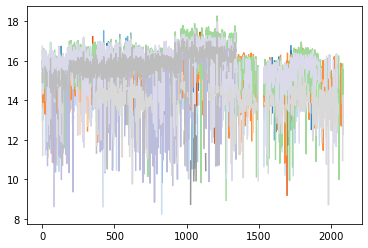

idxs are 1, 6 median is 0.634766258952002 variance is 0.0


anchor [        nan         nan 15.98699748 ...         nan         nan
         nan]
shift [nan nan nan ... nan nan nan]
shifted sample[nan nan nan ... nan nan nan]
shiftfactor 0.634766258952002	samples 6	1
idxs are 1, 11 median is 2.388801810080345 variance is 0.0


anchor [        nan         nan 15.98699748 ...         nan         nan
         nan]
shift [nan nan nan ... nan nan nan]
shifted sample[nan nan nan ... nan nan nan]
shiftfactor 2.388801810080345	samples 11	1
idxs are 3, 15 median is -4.464406608033455 variance is 0.0


anchor [        nan 14.68606275 12.98603756 ...         nan         nan
         nan]
shift [nan nan nan ... nan nan nan]
shifted sample[nan nan nan ... nan nan nan]
shiftfactor -4.464406608033455	samples 15	3
idxs are 8, 16 median is 0.06245707714701787 variance is 0.0


anchor [nan nan nan ... nan nan nan]
shift [nan nan nan ... nan nan nan]
shifted sample[nan nan nan ... nan nan nan]
shiftfacto

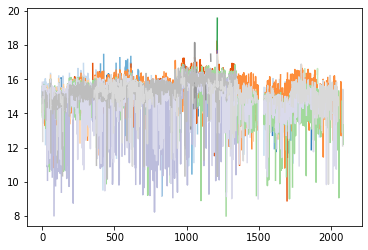

In [14]:
andre_protvals = andre_prots.loc["P26570"].to_numpy().copy()
plot_lines(andre_protvals)
normed_andre_protvals = normalize_withincond(andre_protvals)
plot_lines(normed_andre_protvals)

{'2044', '1762', '3666', '6662', '1632', '4996', '5148', '6361', '4561;4562;9', '2952', '1710', '4024', '2669', '2045;2925', '6872', '2837', '5662', '3435', '4624', '2572', '5998', '6673', '3370', '3837;2852', '381', '5872', '4018;4019;545', '5398', '6065', '2264', '2322', '1206', '6107', '4930', '1075', '2600', '4931', '275', '319', '5716', '5033', '5938', '1392', '1358', '4299', '1775', '858', '6746;814', '3727', '6291', '949', '1347;313', '5660', '3509;1014', '6827', '6111', '6665', '445', '6431', '5429', '6027', '1312', '2388', '4771', '6845', '5848', '6515;4836', '2261', '2900', '4878', '4849', '6646', '2421', '1364', '2020', '2812', '4596', '5936', '6382', '627', '2457', '4737', '2722', '1546', '2602', '326;4552', '2046;2028', '3390', '3558', '1891', '4332;4333;5722', '3918', '6694', '5738', '1979;4011;4012;2032', '3938;4007;3829', '3223', '1056', '3960', '4285', '4946', '6656', '1213', '2754', '4269', '5098', '1893', '3003', '3381', '2792', '4142', '5135', '335', '5186', '6224',

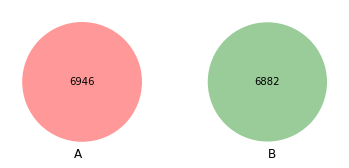

In [14]:
peptides_tsv = "./test_data/normed_mqquant_peps.tsv"
samplemap_tsv = "./test_data/samples.mq.ecoli.map"
normed_df, _ = read_tables(peptides_tsv, samplemap_tsv, "precursor")
normed_df = normed_df.dropna(subset=["protein"])
uniq_prots_1 = set(normed_df["protein"].unique())
uniq_prots_2 = set(pd.read_csv("./test_data/proteinGroups.txt", sep = "\t", usecols = ["Protein IDs"])["Protein IDs"].unique())
from matplotlib_venn import venn2
venn2([uniq_prots_1, uniq_prots_2])
weird_prots = uniq_prots_1 -uniq_prots_2
print(weird_prots)

In [11]:
#use MQ pep output

import numpy as np
import pandas as pd

peptides_tsv = "./test_data/normed_mqquant_peps.tsv"
samplemap_tsv = "./test_data/samples.mq.ecoli.map"
normed_df, _ = read_tables(peptides_tsv, samplemap_tsv, "precursor")
normed_df = normed_df.dropna(subset=["protein"])
normed_df = normed_df.set_index("protein")
protein_df = estimate_protein_intensities(normed_df)

prot 0 of 6946
prot 100 of 6946
prot 200 of 6946
prot 300 of 6946
prot 400 of 6946
prot 500 of 6946
prot 600 of 6946
prot 700 of 6946
prot 800 of 6946
prot 900 of 6946
prot 1000 of 6946
prot 1100 of 6946
prot 1200 of 6946
prot 1300 of 6946
prot 1400 of 6946
prot 1500 of 6946
prot 1600 of 6946
prot 1700 of 6946
prot 1800 of 6946
prot 1900 of 6946
prot 2000 of 6946
prot 2100 of 6946
prot 2200 of 6946
prot 2300 of 6946
prot 2400 of 6946
prot 2500 of 6946
prot 2600 of 6946
prot 2700 of 6946
prot 2800 of 6946
prot 2900 of 6946
prot 3000 of 6946
prot 3100 of 6946
prot 3200 of 6946
prot 3300 of 6946
prot 3400 of 6946
prot 3500 of 6946
prot 3600 of 6946
prot 3700 of 6946
prot 3800 of 6946
prot 3900 of 6946
prot 4000 of 6946
prot 4100 of 6946
prot 4200 of 6946
prot 4300 of 6946
prot 4400 of 6946
prot 4500 of 6946
prot 4600 of 6946
prot 4700 of 6946
prot 4800 of 6946
prot 4900 of 6946
prot 5000 of 6946
prot 5100 of 6946
prot 5200 of 6946
prot 5300 of 6946
prot 5400 of 6946
prot 5500 of 6946
prot

In [9]:
#use AP pep output
import numpy as np
import pandas as pd

peptides_tsv = "./test_data/normed_apquant_peps.tsv"
samplemap_tsv = "./test_data/ap.samples.map"
unnormed_df, labelmap_df = read_tables(peptides_tsv, samplemap_tsv, "precursor")


unnormed_df = unnormed_df.set_index("protein")
protein_df = estimate_protein_intensities(unnormed_df)



NameError: name 'estimate_protein_intensities' is not defined

In [48]:
display(protein_df)

,Intensity Shotgun_02-01_1,Intensity Shotgun_02-01_2,Intensity Shotgun_02-01_3,Intensity Shotgun_12-01_1,Intensity Shotgun_12-01_2,Intensity Shotgun_12-01_3
protein,,,,,,
3397,2.173342e+09,2.640758e+09,2.565600e+09,2.239217e+09,2.769445e+09,2.560029e+09
1686,4.599873e+09,4.130946e+09,4.183079e+09,5.188464e+09,4.582551e+09,3.936954e+09
3376,1.666507e+10,1.508382e+10,1.379617e+10,1.497929e+10,1.314925e+10,1.519485e+10
5693,1.573534e+09,1.717983e+09,1.250105e+09,1.661385e+09,1.520735e+09,1.306307e+09
6196,6.035113e+07,7.339017e+07,4.668457e+07,6.614253e+07,7.212291e+07,6.987259e+07
...,...,...,...,...,...,...
1594;4424,2.255392e+08,NaN,NaN,NaN,NaN,NaN
3003,1.108508e+08,NaN,NaN,NaN,NaN,NaN
479,1.669519e+08,NaN,NaN,NaN,NaN,NaN


In [12]:
def plot_on_identical_proteins(fcnorm_df):
    subset_df = fcnorm_df[['HeLa2_median_ref', 'HeLa12_median_ref', 'HeLa2_median', 'HeLa12_median']].replace([np.inf, -np.inf, 0], np.nan)
    subset_df = subset_df.dropna()
    display(subset_df.describe())
    intersect_idx = subset_df.index
    
    intersec_df = fcnorm_df.loc[intersect_idx]
    plot_fold_change(intersec_df, 'HeLa2_median_ref', 'HeLa12_median_ref')
    plot_fold_change(intersec_df, 'HeLa2_median', 'HeLa12_median')
    

,HeLa2_median_ref,HeLa12_median_ref,HeLa2_median,HeLa12_median
count,5.109000e+03,5.109000e+03,5.109000e+03,5.109000e+03
mean,1.959246e+09,1.855952e+09,1.568625e+09,1.167858e+09
std,5.866858e+09,5.716867e+09,4.809419e+09,3.482058e+09
min,4.954500e+06,3.340900e+06,6.039122e+06,4.025730e+06
25%,1.303900e+08,1.143100e+08,9.852924e+07,7.205246e+07
50%,3.920300e+08,3.603300e+08,3.021893e+08,2.313714e+08
75%,1.406900e+09,1.292600e+09,1.107152e+09,8.313684e+08
max,1.138300e+11,1.023600e+11,1.094646e+11,6.964458e+10


Species=Human, n=4327, median=-0.2819485730388767, dev=0.2755483904290679
species=Ecoli, n=758, median=2.2794062253059018, dev=0.7313302610632626
Species=Human, n=4327, median=0.0436498037749047, dev=0.2635099860118037
species=Ecoli, n=758, median=2.5593804386576995, dev=0.3807615607600492


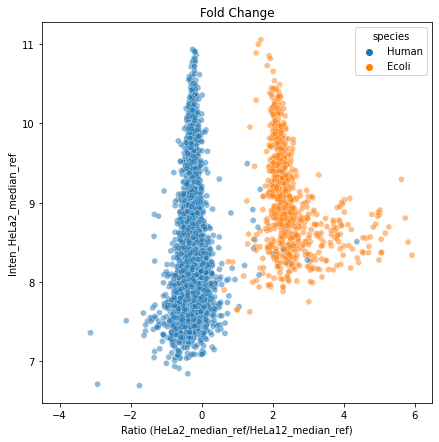

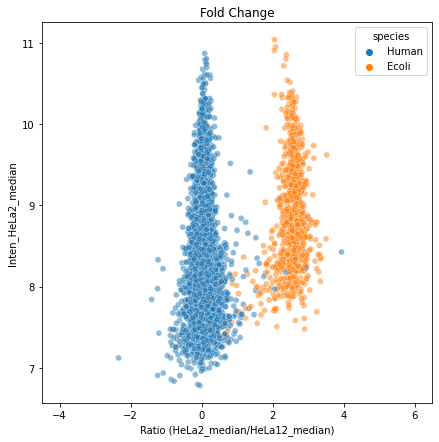

,Intensity Shotgun_02-01_1,Intensity Shotgun_02-01_2,Intensity Shotgun_02-01_3,Intensity Shotgun_12-01_1,Intensity Shotgun_12-01_2,Intensity Shotgun_12-01_3,HeLa2_median,HeLa12_median,LFQ intensity Shotgun_02-01_1,LFQ intensity Shotgun_02-01_2,LFQ intensity Shotgun_02-01_3,LFQ intensity Shotgun_12-01_1,LFQ intensity Shotgun_12-01_2,LFQ intensity Shotgun_12-01_3,species,protein,HeLa12_median_ref,HeLa2_median_ref
3397,2.198773e+09,2.561813e+09,2.561182e+09,2.255228e+09,2.781411e+09,2.589985e+09,2.561182e+09,2.589985e+09,2439800000,2663100000,2709300000,3422300000,3790600000,3589200000,Human,3397,3.589200e+09,2.663100e+09
1686,4.473430e+09,4.619048e+09,4.200032e+09,4.912461e+09,4.463984e+09,3.952910e+09,4.473430e+09,4.463984e+09,4383000000,5713300000,5323200000,5979700000,6701500000,6184300000,Human,1686,6.184300e+09,5.323200e+09
3376,1.758897e+10,1.508888e+10,1.456102e+10,1.437269e+10,1.339866e+10,1.385823e+10,1.508888e+10,1.385823e+10,19829000000,16819000000,15898000000,20145000000,17964000000,18437000000,Human,3376,1.843700e+10,1.681900e+10
5693,1.502931e+09,1.525967e+09,1.314149e+09,1.535557e+09,1.620938e+09,1.530507e+09,1.502931e+09,1.535557e+09,1771000000,1701200000,1649100000,2156700000,2159100000,2197700000,Human,5693,2.159100e+09,1.701200e+09
6196,6.035113e+07,7.339017e+07,4.668457e+07,6.614253e+07,7.212291e+07,6.987259e+07,6.035113e+07,6.987259e+07,69286000,83470000,52996000,94452000,103660000,99112000,Human,6196,9.911200e+07,6.928600e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,5.619040e+09,NaN,NaN,NaN,NaN,NaN,5.619040e+09,NaN,611450000,780690000,747290000,1177900000,876960000,1084400000,Human,129,1.084400e+09,7.472900e+08
2608,9.276354e+07,NaN,NaN,NaN,NaN,NaN,9.276354e+07,NaN,36318000,28820000,37329000,0,4563000,0,Ecoli,2608,0.000000e+00,3.631800e+07
3003,1.108508e+08,NaN,NaN,NaN,NaN,NaN,1.108508e+08,NaN,245420000,332240000,336000000,0,6364700,0,Ecoli,3003,0.000000e+00,3.322400e+08
479,1.669519e+08,NaN,NaN,NaN,NaN,NaN,1.669519e+08,NaN,0,0,54287000,56115000,54443000,60201000,Human,479,5.611500e+07,0.000000e+00


,Intensity Shotgun_02-01_1,Intensity Shotgun_02-01_2,Intensity Shotgun_02-01_3,Intensity Shotgun_12-01_1,Intensity Shotgun_12-01_2,Intensity Shotgun_12-01_3,HeLa2_median,HeLa12_median
protein,,,,,,,,
3397,2.198773e+09,2.561813e+09,2.561182e+09,2.255228e+09,2.781411e+09,2.589985e+09,2.561182e+09,2.589985e+09
1686,4.473430e+09,4.619048e+09,4.200032e+09,4.912461e+09,4.463984e+09,3.952910e+09,4.473430e+09,4.463984e+09
3376,1.758897e+10,1.508888e+10,1.456102e+10,1.437269e+10,1.339866e+10,1.385823e+10,1.508888e+10,1.385823e+10
5693,1.502931e+09,1.525967e+09,1.314149e+09,1.535557e+09,1.620938e+09,1.530507e+09,1.502931e+09,1.535557e+09
6196,6.035113e+07,7.339017e+07,4.668457e+07,6.614253e+07,7.212291e+07,6.987259e+07,6.035113e+07,6.987259e+07
...,...,...,...,...,...,...,...,...
1594;4424,2.255392e+08,NaN,NaN,NaN,NaN,NaN,2.255392e+08,NaN
3003,1.108508e+08,NaN,NaN,NaN,NaN,NaN,1.108508e+08,NaN
479,1.669519e+08,NaN,NaN,NaN,NaN,NaN,1.669519e+08,NaN


In [13]:
import pandas as pd

mq_lfq = pd.read_csv("./test_data/proteinGroups.txt", sep = "\t", usecols = ["LFQ intensity Shotgun_12-01_1", "LFQ intensity Shotgun_12-01_2", "LFQ intensity Shotgun_12-01_3",
"LFQ intensity Shotgun_02-01_1", "LFQ intensity Shotgun_02-01_2", "LFQ intensity Shotgun_02-01_3", "Species", "id"]).rename(columns = {"Species":"species",
"id" : "protein"})
mq_lfq["species"] = mq_lfq["species"].replace(to_replace={"Homo sapiens" : "Human", "Escherichia coli" : "Ecoli"})
mq_lfq = mq_lfq.astype({"protein" :"str"})
minrep = 1

ap_c1_filt_idx = mq_lfq[["LFQ intensity Shotgun_12-01_1", "LFQ intensity Shotgun_12-01_2", "LFQ intensity Shotgun_12-01_3"]].dropna(thresh=minrep, axis=0).index
ap_c2_filt_idx = mq_lfq[["LFQ intensity Shotgun_02-01_1", "LFQ intensity Shotgun_02-01_2", "LFQ intensity Shotgun_02-01_3"]].dropna(thresh=minrep, axis=0).index

mq_lfq["HeLa12_median_ref"] = mq_lfq[["LFQ intensity Shotgun_12-01_1", "LFQ intensity Shotgun_12-01_2", "LFQ intensity Shotgun_12-01_3"]].median(axis = 1)
mq_lfq["HeLa2_median_ref"] = mq_lfq[["LFQ intensity Shotgun_02-01_1", "LFQ intensity Shotgun_02-01_2", "LFQ intensity Shotgun_02-01_3"]].median(axis = 1)
idx_intersect = ap_c1_filt_idx.intersection(ap_c2_filt_idx)
mq_lfq = mq_lfq.loc[idx_intersect]

protein_df["HeLa2_median"] = protein_df[["Intensity Shotgun_02-01_1", "Intensity Shotgun_02-01_2", "Intensity Shotgun_02-01_3"]].median(axis = 1)
protein_df["HeLa12_median"] = protein_df[["Intensity Shotgun_12-01_1", "Intensity Shotgun_12-01_2", "Intensity Shotgun_12-01_3"]].median(axis = 1)

fcnorm_annot = protein_df.merge(mq_lfq, left_index= True, right_on= "protein", suffixes= (None, "_ref"))

plot_on_identical_proteins(fcnorm_annot)



#plot_fold_change(fcnorm_annot, "LFQ intensity Shotgun_02-01_1", "LFQ intensity Shotgun_12-01_2")
#plot_fold_change(fcnorm_annot, 'Intensity Shotgun_02-01_1', "Intensity Shotgun_12-01_2")
display(fcnorm_annot)
display(protein_df)



2112


,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0001_P01A01_YLR106C___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0001_P01A01_YLR106C___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0002_P01B01_YKR054C___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0002_P01B01_YKR054C___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0003_P01C01_YDR457W___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0003_P01C01_YDR457W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0004_P01D01_YDR150W___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0004_P01D01_YDR150W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0005_P01E01_YGL195W___01,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_0005_P01E01_YGL195W___02,...,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3932_P41D12_YBR265W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3932_P41D12_YBR265W___03,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3933_P41E12_YDR033W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3933_P41E12_YDR033W___03,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3934_P41F12_YCR069W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3934_P41F12_YCR069W___03,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3935_P41G12_YIL117C___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3935_P41G12_YIL117C___03,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3936_P41H12_YPL087W___02,Intensity 20190621_TIMS3_Evo4_AnMi_SA_Yeast-Interactome_3936_P41H12_YPL087W___03
Leading razor protein,,,,,,,,,,,,,,,,,,,,,
P38915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
REV__P25374,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P09938,NaN,NaN,NaN,NaN,NaN,NaN,134950.0,NaN,NaN,NaN,...,NaN,22446.0,NaN,NaN,NaN,42325.0,NaN,NaN,NaN,NaN
P26570,NaN,13537.0,NaN,47289.0,NaN,104030.0,NaN,57272.0,NaN,39388.0,...,36180.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P15180,NaN,44126.0,3824.1,6150.4,NaN,22674.0,19341.0,20932.0,NaN,21541.0,...,15662.0,NaN,69446.0,NaN,72927.0,NaN,11459.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P27614,45816.0,NaN,NaN,NaN,NaN,NaN,75799.0,NaN,88196.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39532.0,NaN,NaN
P21771,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P34217,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,protein,PXD006109_HeLa12_1_LFQ,PXD006109_HeLa12_2_LFQ,PXD006109_HeLa12_3_LFQ,PXD006109_HeLa2_1_LFQ,PXD006109_HeLa2_2_LFQ,PXD006109_HeLa2_3_LFQ,PXD006109_HeLa12_1,PXD006109_HeLa12_2,PXD006109_HeLa12_3,...,HeLa12_1,precursor,HeLa12_2,HeLa12_3,HeLa2_1,HeLa2_2,HeLa2_3,species,HeLa12_median_ref,HeLa2_median_ref
0,sp|P36578|RL4_HUMAN,5.535647e+10,4.496180e+10,4.786562e+10,4.307915e+10,3.523617e+10,3.580661e+10,5.892905e+10,4.526883e+10,4.276544e+10,...,971513414.0,KPLVGK_2,893871809.0,985189279.0,691297616.0,851138496.0,541841950.0,Human,4.786562e+10,3.580661e+10
1,sp|Q9P258|RCC2_HUMAN,5.040674e+09,4.318525e+09,4.973918e+09,4.307535e+09,3.415510e+09,3.562226e+09,5.971181e+09,4.734482e+09,4.153145e+09,...,457596530.0,SSTAAQEVK_2,381209191.0,256570404.0,NaN,NaN,324676280.0,Human,4.973918e+09,3.562226e+09
2,sp|P55036|PSMD4_HUMAN,3.663486e+09,3.473264e+09,2.910355e+09,3.339283e+09,2.702214e+09,2.550902e+09,3.953403e+09,3.918737e+09,3.128546e+09,...,306766162.0,LHTVQPK_2,332229397.0,308139245.0,160286706.0,300162867.0,161454022.0,Human,3.473264e+09,2.702214e+09
3,sp|Q9NQP4|PFD4_HUMAN,1.507582e+09,1.177011e+09,1.225331e+09,NaN,8.589166e+08,1.071547e+09,1.304392e+09,9.851766e+08,1.528412e+09,...,750467804.0,NLQEEIDALESR_2,504447053.0,611693431.0,NaN,339422930.0,432822111.0,Human,1.225331e+09,9.652318e+08
4,sp|Q01780|EXOSX_HUMAN,2.844178e+09,3.095957e+09,2.919838e+09,2.080623e+09,1.806327e+09,1.880328e+09,2.657281e+09,1.592799e+09,1.849392e+09,...,175289062.0,IYEISNR_2,NaN,NaN,NaN,NaN,NaN,Human,2.919838e+09,1.880328e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5981,sp|Q9Y287|ITM2B_HUMAN,NaN,NaN,1.586439e+08,NaN,5.936193e+08,NaN,NaN,NaN,1.586427e+08,...,NaN,VTFNSALAQK_2,NaN,158642696.0,NaN,593620520.0,NaN,Human,1.586439e+08,5.936193e+08
5982,sp|Q8FL63|DDLB_ECOL6,NaN,NaN,2.191570e+07,2.036206e+08,2.007224e+08,9.282310e+07,NaN,NaN,2.126620e+07,...,NaN,VVAENALQDALR_2,NaN,21266202.0,197616189.0,194750214.0,90068828.0,Ecoli,2.191570e+07,2.007224e+08
5988,sp|Q9UHW5|GPN3_HUMAN,NaN,NaN,2.245543e+08,NaN,NaN,1.709889e+08,NaN,NaN,2.086303e+08,...,NaN,YAQLVMGPAGSGK_2,NaN,208630261.0,NaN,NaN,158756561.0,Human,2.245543e+08,1.709889e+08
5990,sp|Q14315|FLNC_HUMAN,NaN,NaN,5.258933e+08,NaN,3.280941e+08,4.628415e+08,NaN,NaN,5.037978e+08,...,NaN,YGGDEIPYSPFR_2,NaN,503797750.0,NaN,314322281.0,443318130.0,Human,5.258933e+08,3.954678e+08


Species=Human, n=4344, median=-0.4110078006012575, dev=0.6448116512435641
species=Ecoli, n=626, median=2.393957930933362, dev=0.7672329444126358
Species=Human, n=3180, median=-0.05044510963579708, dev=0.35237050757082267
species=Ecoli, n=418, median=2.7589259913424407, dev=0.3936571586723117
Species=Human, n=3338, median=-0.3771170512513031, dev=0.4844298494980092
species=Ecoli, n=450, median=2.426809065264167, dev=0.5764341810089724
Species=Human, n=2843, median=-0.03495344529795117, dev=0.4297477624336551
species=Ecoli, n=368, median=2.7784720710756563, dev=0.5003906816657114


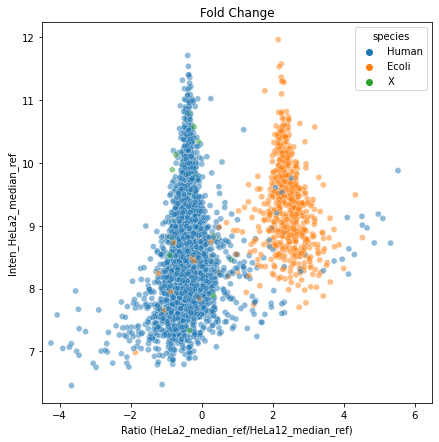

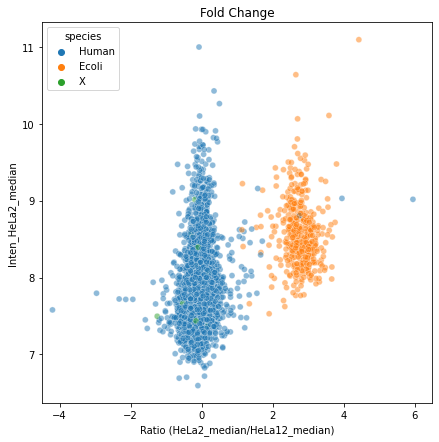

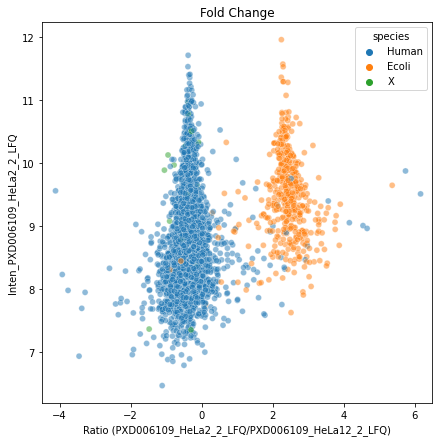

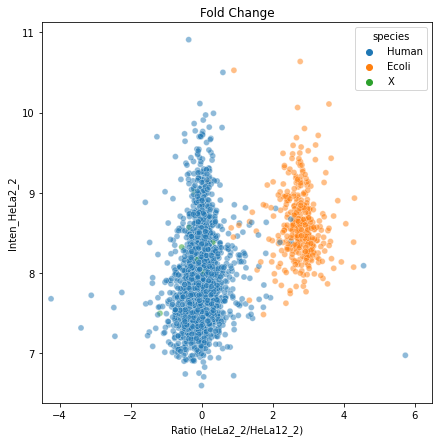

In [24]:
import pandas as pd

ap_lfq = pd.read_csv("./test_data/results_proteins.csv")
ap_annot = pd.read_csv("./test_data/ap_quant_peptides.tsv", sep = "\t").drop_duplicates(subset = 'protein')
ap_lfq = ap_lfq.merge(ap_annot, on = "protein")

ap_lfq = pd.read_csv("./test_data/results_proteins.csv")
ap_annot = pd.read_csv("./test_data/ap_quant_peptides.tsv", sep = "\t").drop_duplicates(subset = 'protein')
ap_lfq = ap_lfq.merge(ap_annot, on = "protein")
minrep = 1
ap_c1_filt_idx = ap_lfq[["PXD006109_HeLa12_1_LFQ", "PXD006109_HeLa12_2_LFQ", "PXD006109_HeLa12_3_LFQ"]].dropna(thresh=minrep, axis=0).index
ap_c2_filt_idx = ap_lfq[["PXD006109_HeLa2_1_LFQ", "PXD006109_HeLa2_2_LFQ", "PXD006109_HeLa2_3_LFQ"]].dropna(thresh=minrep, axis=0).index

ap_lfq["HeLa12_median_ref"] = ap_lfq[["PXD006109_HeLa12_1_LFQ", "PXD006109_HeLa12_2_LFQ", "PXD006109_HeLa12_3_LFQ"]].median(axis = 1)
ap_lfq["HeLa2_median_ref"] = ap_lfq[["PXD006109_HeLa2_1_LFQ", "PXD006109_HeLa2_2_LFQ", "PXD006109_HeLa2_3_LFQ"]].median(axis = 1)
idx_intersect = ap_c1_filt_idx.intersection(ap_c2_filt_idx)
ap_lfq = ap_lfq.loc[idx_intersect]
display(ap_lfq)



fcnorm_annot = protein_df.merge(ap_annot, left_index= True, right_on= "protein", suffixes= (None, "_ref"))
fcnorm_annot["HeLa12_median"] = fcnorm_annot[["HeLa12_1","HeLa12_2","HeLa12_3"]].median(axis = 1)
fcnorm_annot["HeLa2_median"] = fcnorm_annot[["HeLa2_1","HeLa2_2","HeLa2_3"]].median(axis = 1)


plot_fold_change(ap_lfq, 'HeLa2_median_ref', 'HeLa12_median_ref')
plot_fold_change(fcnorm_annot, 'HeLa2_median', 'HeLa12_median')

plot_fold_change(ap_lfq, 'PXD006109_HeLa2_2_LFQ', 'PXD006109_HeLa12_2_LFQ')
plot_fold_change(fcnorm_annot, 'HeLa2_2', 'HeLa12_2')

#display(protein_df)
